## Laboratorium 6


## Detekcja obiektów za pomocą modeli głębokich (na przykładzie Faster-RCNN)

### Wprowadzenie

Celem tej listy jest praktyczne zapoznanie się z działaniem dwuetapowych modeli do detekcji obiektów na przykładzie Faster R-CNN. Skorzystamy z gotowej implementacji modelu z pakietu [`torchvision`](https://github.com/pytorch/vision/blob/main/torchvision/models/detection/faster_rcnn.py). Jeżeli masz inny ulubiony model działający na podobnej zasadzie, możesz z niego skorzystać zamiast podanego. Podobnie implementacja - jeśli masz swoją ulubioną bibliotekę np. Detectron2, MMDetection, możesz z niej skorzystać.

W zadaniu wykorzystany zostanie zbiór danych [_Chess Pieces Dataset_](https://public.roboflow.com/object-detection/chess-full) (autorstwa Roboflow, domena publiczna), ZIP z obrazami i anotacjami powinien być dołączony do instrukcji.

Podczas realizacji tej listy większy nacisk położony zostanie na inferencję z użyciem Faster R-CNN niż na uczenie (które przeprowadzisz raz\*). Kluczowe komponenty w tej architekturze (RPN i RoIHeads) można konfigurować bez ponownego uczenia, dlatego badania skupią się na ich strojeniu. Aby zrozumieć działanie modelu, konieczne będzie spojrzenie w jego głąb, włącznie z częściowym wykonaniem. W tym celu warto mieć na podorędziu kod źródłowy, w szczególności implementacje następujących klas (uwaga - linki do najnowszej implementacji; upewnij się więc, że czytasz kod używanej przez siebie wersji biblioteki):
* `FasterRCNN`: https://github.com/pytorch/vision/blob/main/torchvision/models/detection/faster_rcnn.py
* `GeneralizedRCNN`: https://github.com/pytorch/vision/blob/main/torchvision/models/detection/generalized_rcnn.py
* `RegionProposalNetwork`: https://github.com/pytorch/vision/blob/main/torchvision/models/detection/rpn.py
* `RoIHeads`: https://github.com/pytorch/vision/blob/main/torchvision/models/detection/roi_heads.py

Dogłębne zrozumienie procedury uczenia modelu nie będzie wymagane, niemniej należy mieć ogólną świadomość jak ten proces przebiega i jakie funkcje kosztu są wykorzystywane. Użyjemy gotowej implementacji z submodułu [`references.detection`](https://github.com/pytorch/vision/blob/main/references/detection/train.py) w nieco uproszczonej wersji. Ponieważ ten moduł **nie** jest domyślnie instalowaną częścią pakietu `torchvision`, do instrukcji dołączono jego kod w nieznacznie zmodyfikowanej wersji (`references_detection.zip`).
Jeśli ciekawią Cię szczegóły procesu uczenia, zachęcam do lektury [artykułu](https://arxiv.org/abs/1506.01497) i analizy kodu implementacji.

In [1]:
!pip install pycocotools

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com


### Zadanie 0: Uczenie

Krokiem "zerowym" będzie przygotowanie wstępnie nauczonego modelu i douczenie go na docelowym zbiorze.
Podany zestaw hiperparametrów powinien dawać przyzwoite (niekoniecznie idealne) wyniki - jeśli chcesz, śmiało dobierz swoje własne; nie spędzaj na tym jednak zbyt wiele czasu.

Twoim zadaniem jest nie tylko przeklikanie poniższych komórek, ale przynajmniej ogólne zrozumienie procesu uczenia (przejrzyj implementację `train_one_epoch`) i struktury modelu.

In [2]:
import os
import time
import datetime

import torch
import torch.utils.data
import torchvision
import torchvision.models.detection as M
from torchvision.io.image import read_image
from torchvision.utils import draw_bounding_boxes
from torchvision.transforms.functional import to_pil_image

from detection import coco_utils, presets, utils, transforms
from detection.engine import train_one_epoch, evaluate

In [3]:
def get_dataset(img_root:str, file_name:str, train:bool=True):
  """Reimplementacja analogicznej funkcji z pakietu references, rozwiązująca drobną niekompatybilność w zbiorze CPD"""
  def fake_segmentation(image, target):
    for obj in target['annotations']:
      x, y, w, h = obj['bbox']
      segm = [x, y, x+w, y, x+w, y+h, x, y+h]
      obj['segmentation'] = [segm]
    return image, target

  tfs = transforms.Compose([
    fake_segmentation,
    coco_utils.ConvertCocoPolysToMask(),
    presets.DetectionPresetTrain(data_augmentation='hflip') if train else presets.DetectionPresetEval(),
    # jeśli chcesz dodać swoje własne augmentacje, możesz zrobić to tutaj
  ])
  ds = coco_utils.CocoDetection(img_root, file_name, transforms=tfs)
  return ds

In [4]:
# Konfiguracja hiperparametrów
LR = 0.001 # powinno być dobrze dla 1 GPU
WDECAY = 0.0001
EPOCHS = 25
VAL_FREQ = 5 # walidacja i checkpointowanie co N epok
BATCH_SIZE = 8 # dobierz pod możliwości sprzętowe
NUM_WORKERS = 0 # j/w
NUM_CLASSES = 14
DEVICE = 'cuda:0'
DATASET_ROOT = 'chess/'
OUTPUT_DIR = 'outputs/'

In [5]:
# Zaczytanie datasetów
chess_train = get_dataset(os.path.join(DATASET_ROOT, 'train'), os.path.join(DATASET_ROOT, 'train/_annotations.coco.json'))
chess_val = get_dataset(os.path.join(DATASET_ROOT, 'valid'), os.path.join(DATASET_ROOT, 'valid/_annotations.coco.json'), train=False)

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [6]:
# samplery i loadery
train_sampler = torch.utils.data.RandomSampler(chess_train)
train_batch_sampler = torch.utils.data.BatchSampler(train_sampler, BATCH_SIZE, drop_last=True)
train_loader = torch.utils.data.DataLoader(
  chess_train, batch_sampler=train_batch_sampler, num_workers=NUM_WORKERS, collate_fn=utils.collate_fn
)

val_sampler = torch.utils.data.SequentialSampler(chess_val)
val_loader = torch.utils.data.DataLoader(
  chess_val, batch_size=1, sampler=val_sampler, num_workers=NUM_WORKERS, collate_fn=utils.collate_fn
)

In [7]:
# Skonstruowanie modelu; tworzymy w wersji dla 91 klas aby zainicjować wagi wstępnie nauczone na COCO...
model = M.fasterrcnn_resnet50_fpn(weights=M.FasterRCNN_ResNet50_FPN_Weights.COCO_V1, num_classes=91).to(DEVICE)
# ...po czym zastępujemy predyktor mniejszym, dostosowanym do naszego zbioru:
model.roi_heads.box_predictor = M.faster_rcnn.FastRCNNPredictor(in_channels=1024, num_classes=NUM_CLASSES).to(DEVICE)

In [8]:
model # zwróć uwagę na strukturę Box Predictora (dlaczego tyle out_features?)

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [9]:
# Zanim przejdziemy do uczenia pełnego modelu, wykonamy krótkie wstępne uczenie losowo zainicjowanego predyktora:
train_one_epoch(
  model=model,
  optimizer=torch.optim.AdamW(model.roi_heads.box_predictor.parameters(), lr=LR, weight_decay=WDECAY),
  data_loader=train_loader,
  device=DEVICE,
  epoch=0, print_freq=3, scaler=None
)

d:\studia\Obrazki i Video\AnalizaObrazkowIVideo\lab6\detection\engine.py:30: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=scaler is not None):


Epoch: [0]  [ 0/25]  eta: 0:00:43  lr: 0.000043  loss: 3.9986 (3.9986)  loss_classifier: 2.9720 (2.9720)  loss_box_reg: 0.5473 (0.5473)  loss_objectness: 0.4446 (0.4446)  loss_rpn_box_reg: 0.0346 (0.0346)  time: 1.7537  data: 0.5465  max mem: 7986
Epoch: [0]  [ 3/25]  eta: 0:00:24  lr: 0.000168  loss: 3.5431 (3.6625)  loss_classifier: 2.9615 (2.9524)  loss_box_reg: 0.3673 (0.3986)  loss_objectness: 0.2584 (0.2871)  loss_rpn_box_reg: 0.0205 (0.0246)  time: 1.1346  data: 0.4007  max mem: 8012
Epoch: [0]  [ 6/25]  eta: 0:00:20  lr: 0.000292  loss: 3.5463 (3.6097)  loss_classifier: 2.8995 (2.8434)  loss_box_reg: 0.3837 (0.4127)  loss_objectness: 0.3313 (0.3277)  loss_rpn_box_reg: 0.0245 (0.0259)  time: 1.0721  data: 0.4114  max mem: 8113
Epoch: [0]  [ 9/25]  eta: 0:00:16  lr: 0.000417  loss: 3.4968 (3.3584)  loss_classifier: 2.7003 (2.6461)  loss_box_reg: 0.3739 (0.3917)  loss_objectness: 0.2826 (0.2974)  loss_rpn_box_reg: 0.0206 (0.0232)  time: 1.0124  data: 0.3830  max mem: 8113
Epoch: [

In [10]:
# Uczenie pełnego modelu
optimizer = torch.optim.AdamW(
  [p for p in model.parameters() if p.requires_grad],
  lr=LR,
  weight_decay=WDECAY
)
lr_scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[10], gamma=0.1) # dobierz wartości jeśli trzeba

start_time = time.time()
for epoch in range(EPOCHS):
    train_one_epoch(model, optimizer, train_loader, DEVICE, epoch, 12, None)
    lr_scheduler.step()

    # eval and checkpoint every VAL_FREQ epochs
    if (epoch+1) % VAL_FREQ == 0:
      checkpoint = {
          "model": model.state_dict(),
          "optimizer": optimizer.state_dict(),
          "lr_scheduler": lr_scheduler.state_dict(),
          "epoch": epoch,
      }
      utils.save_on_master(checkpoint, os.path.join(OUTPUT_DIR, f"model_{epoch}.pth"))
      utils.save_on_master(checkpoint, os.path.join(OUTPUT_DIR, "checkpoint.pth"))
      evaluate(model, val_loader, device=DEVICE)

total_time = time.time() - start_time
total_time_str = str(datetime.timedelta(seconds=int(total_time)))
print(f"Training time {total_time_str}")

Epoch: [0]  [ 0/25]  eta: 0:00:24  lr: 0.000043  loss: 1.2220 (1.2220)  loss_classifier: 0.6184 (0.6184)  loss_box_reg: 0.2564 (0.2564)  loss_objectness: 0.3253 (0.3253)  loss_rpn_box_reg: 0.0219 (0.0219)  time: 0.9793  data: 0.4071  max mem: 8247
Epoch: [0]  [12/25]  eta: 0:00:13  lr: 0.000542  loss: 0.8285 (0.9076)  loss_classifier: 0.4912 (0.5096)  loss_box_reg: 0.3046 (0.3019)  loss_objectness: 0.0109 (0.0711)  loss_rpn_box_reg: 0.0219 (0.0250)  time: 1.0179  data: 0.4333  max mem: 8393
Epoch: [0]  [24/25]  eta: 0:00:00  lr: 0.001000  loss: 0.8631 (1.0221)  loss_classifier: 0.4838 (0.6125)  loss_box_reg: 0.3046 (0.3162)  loss_objectness: 0.0098 (0.0546)  loss_rpn_box_reg: 0.0265 (0.0389)  time: 0.9750  data: 0.3877  max mem: 8393
Epoch: [0] Total time: 0:00:24 (0.9856 s / it)
Epoch: [1]  [ 0/25]  eta: 0:00:25  lr: 0.001000  loss: 0.8928 (0.8928)  loss_classifier: 0.5316 (0.5316)  loss_box_reg: 0.3166 (0.3166)  loss_objectness: 0.0126 (0.0126)  loss_rpn_box_reg: 0.0321 (0.0321)  tim

In [11]:
# Inferencja na zadanym obrazie
preprocess = M.FasterRCNN_ResNet50_FPN_Weights.COCO_V1.transforms() # to wystarczy pobrać raz
img = read_image(os.path.join(DATASET_ROOT, 'test/IMG_0159_JPG.rf.1cf4f243b5072d63e492711720df35f7.jpg'))
batch = [preprocess(img).to(DEVICE)]
prediction = model(batch)[0]
# Rysowanie predykcji - wygodny gotowiec
box = draw_bounding_boxes(
  img,
  boxes=prediction['boxes'],
  labels=[chess_train.coco.cats[i.item()]['name'] for i in prediction['labels']],
  colors='red',
  width=4,
)
to_pil_image(box.detach()).show()

---
### Zadanie 1

Zbadaj wpływ parametrów inferencji **głowic `RoIHeads`**, konkretnie progu prawdopodobieństwa (`score_thresh`) i progu NMS (`nms_thresh`), na działanie modelu. Wykorzystaj funkcję `evaluate` aby zmierzyć zmianę jakości predykcji, ale przebadaj też efekty wizualnie, wyświetlając predykcje dla kilku obrazów ze zbioru walidacyjnego i kilku spoza zbioru (folder `wild`). _W finalnej wersji pozostaw tylko wybrane interesujące przykłady._

In [14]:
import matplotlib.pyplot as plt
import pandas as pd

from torchvision.io.image import read_image
from torchvision.utils import draw_bounding_boxes
from torchvision.transforms.functional import to_pil_image

In [15]:
def evaluate_with_thresholds(model, data_loader, score_thresh, nms_thresh, device):
    original_score_thresh = model.roi_heads.score_thresh
    original_nms_thresh = model.roi_heads.nms_thresh
    
    model.roi_heads.score_thresh = score_thresh
    model.roi_heads.nms_thresh = nms_thresh
    
    print(f"Eva;l with score_thresh={score_thresh}, nms_thresh={nms_thresh}")
    
    coco_evaluator = evaluate(model, data_loader, device=device)
    
    model.roi_heads.score_thresh = original_score_thresh
    model.roi_heads.nms_thresh = original_nms_thresh
    
    return coco_evaluator

In [13]:
print(f"Default score_thresh: {model.roi_heads.score_thresh}")
print(f"Default nms_thresh: {model.roi_heads.nms_thresh}")

Default score_thresh: 0.05
Default nms_thresh: 0.5


In [16]:
score_thresholds = [0.005, 0.01, 0.05, 0.3, 0.5, 0.9]
nms_thresholds = [0.2, 0.4, 0.6, 0.8, 0.9]

results = []

In [17]:
print("Impact of score_thresh (nms_thresh=0.5)")

for score_th in score_thresholds:
    eval_result = evaluate_with_thresholds(model, val_loader, score_th, 0.5, DEVICE)
    stats = eval_result.coco_eval['bbox'].stats
    results.append({
        'score_thresh': score_th,
        'nms_thresh': 0.5,
        'mAP': stats[0],
        'mAP_50': stats[1],
        'mAP_75': stats[2],
    })

Impact of score_thresh (nms_thresh=0.5)
Eva;l with score_thresh=0.005, nms_thresh=0.5
Test:  [ 0/58]  eta: 0:00:23  model_time: 0.3190 (0.3190)  evaluator_time: 0.0020 (0.0020)  time: 0.4126  data: 0.0816  max mem: 8499
Test:  [57/58]  eta: 0:00:00  model_time: 0.0290 (0.0359)  evaluator_time: 0.0010 (0.0012)  time: 0.0795  data: 0.0465  max mem: 8499
Test: Total time: 0:00:05 (0.0883 s / it)
Averaged stats: model_time: 0.0290 (0.0359)  evaluator_time: 0.0010 (0.0012)
Accumulating evaluation results...
DONE (t=0.03s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.766
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.988
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.944
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large |

In [18]:
print("Impact of nms_thresh (score_thresh=0.05)")

for nms_th in nms_thresholds:
    eval_result = evaluate_with_thresholds(model, val_loader, 0.05, nms_th, DEVICE)
    stats = eval_result.coco_eval['bbox'].stats
    results.append({
        'score_thresh': 0.05,
        'nms_thresh': nms_th,
        'mAP': stats[0],
        'mAP_50': stats[1],
        'mAP_75': stats[2],
    })

Impact of nms_thresh (score_thresh=0.05)
Eva;l with score_thresh=0.05, nms_thresh=0.2
Test:  [ 0/58]  eta: 0:00:07  model_time: 0.0340 (0.0340)  evaluator_time: 0.0010 (0.0010)  time: 0.1225  data: 0.0845  max mem: 8499
Test:  [57/58]  eta: 0:00:00  model_time: 0.0290 (0.0301)  evaluator_time: 0.0010 (0.0010)  time: 0.0783  data: 0.0464  max mem: 8499
Test: Total time: 0:00:04 (0.0819 s / it)
Averaged stats: model_time: 0.0290 (0.0301)  evaluator_time: 0.0010 (0.0010)
Accumulating evaluation results...
DONE (t=0.02s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.765
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.985
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.942
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large |

 score_thresh  nms_thresh      mAP   mAP_50   mAP_75
        0.005         0.5 0.766056 0.987541 0.944016
        0.010         0.5 0.766056 0.987541 0.944016
        0.050         0.5 0.764515 0.985340 0.941816
        0.300         0.5 0.764515 0.985340 0.941816
        0.500         0.5 0.764515 0.985340 0.941816
        0.900         0.5 0.761483 0.980627 0.938081
        0.050         0.2 0.764515 0.985340 0.941816
        0.050         0.4 0.764515 0.985340 0.941816
        0.050         0.6 0.764515 0.985340 0.941816
        0.050         0.8 0.767024 0.985340 0.947695
        0.050         0.9 0.776479 0.980934 0.955395


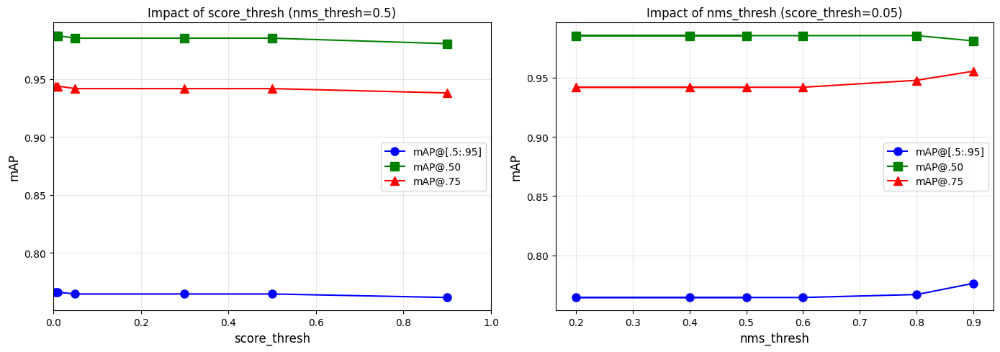

In [19]:
df_results = pd.DataFrame(results)
print(df_results.to_string(index=False))

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

df_score = df_results[df_results['nms_thresh'] == 0.5]
axes[0].plot(df_score['score_thresh'], df_score['mAP'], 'b-o', label='mAP@[.5:.95]', markersize=8)
axes[0].plot(df_score['score_thresh'], df_score['mAP_50'], 'g-s', label='mAP@.50', markersize=8)
axes[0].plot(df_score['score_thresh'], df_score['mAP_75'], 'r-^', label='mAP@.75', markersize=8)
axes[0].set_xlabel('score_thresh', fontsize=12)
axes[0].set_ylabel('mAP', fontsize=12)
axes[0].set_title('Impact of score_thresh (nms_thresh=0.5)', fontsize=12)
axes[0].legend()
axes[0].grid(True, alpha=0.3)
axes[0].set_xlim(0, 1)

df_nms = df_results[df_results['score_thresh'] == 0.05]
axes[1].plot(df_nms['nms_thresh'], df_nms['mAP'], 'b-o', label='mAP@[.5:.95]', markersize=8)
axes[1].plot(df_nms['nms_thresh'], df_nms['mAP_50'], 'g-s', label='mAP@.50', markersize=8)
axes[1].plot(df_nms['nms_thresh'], df_nms['mAP_75'], 'r-^', label='mAP@.75', markersize=8)
axes[1].set_xlabel('nms_thresh', fontsize=12)
axes[1].set_ylabel('mAP', fontsize=12)
axes[1].set_title('Impact of nms_thresh (score_thresh=0.05)', fontsize=12)
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [20]:
val_images = [os.path.join(DATASET_ROOT, 'valid', chess_val.coco.imgs[img_id]['file_name']) 
            for img_id in list(chess_val.coco.imgs.keys())[:3]]

test_image = val_images[0]

In [21]:
def visualize_threshold_impact(image_path, param_name, param_values, fixed_param_name, fixed_param_value):
    _, axes = plt.subplots(1, len(param_values), figsize=(6 * len(param_values), 6))
    
    model.eval()
    img = read_image(image_path)
    
    for idx, param_val in enumerate(param_values):
        if param_name == 'score_thresh':
            model.roi_heads.score_thresh = param_val
            model.roi_heads.nms_thresh = fixed_param_value
        else:
            model.roi_heads.score_thresh = fixed_param_value
            model.roi_heads.nms_thresh = param_val
        
        batch = [preprocess(img).to(DEVICE)]
        with torch.no_grad():
            prediction = model(batch)[0]
        
        labels_with_scores = [
            f"{chess_train.coco.cats[label.item()]['name']}: {score:.2f}"
            for label, score in zip(prediction['labels'], prediction['scores'])
        ]
        
        if len(prediction['boxes']) > 0:
            box_img = draw_bounding_boxes(img, boxes=prediction['boxes'], 
                                        labels=labels_with_scores, colors='red', width=3)
        else:
            box_img = img
        
        axes[idx].imshow(to_pil_image(box_img.detach()))
        axes[idx].set_title(f"{param_name}={param_val}\nDetections: {len(prediction['boxes'])}", fontsize=11)
        axes[idx].axis('off')
    
    model.roi_heads.score_thresh = 0.05
    model.roi_heads.nms_thresh = 0.5
    
    plt.suptitle(f"Impact of {param_name} on detection number ({fixed_param_name}={fixed_param_value})\nIMG: {os.path.basename(image_path)}", fontsize=14)
    plt.tight_layout()
    plt.show()

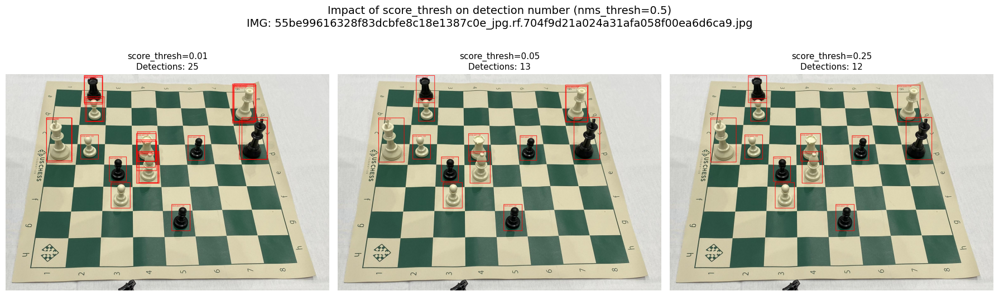

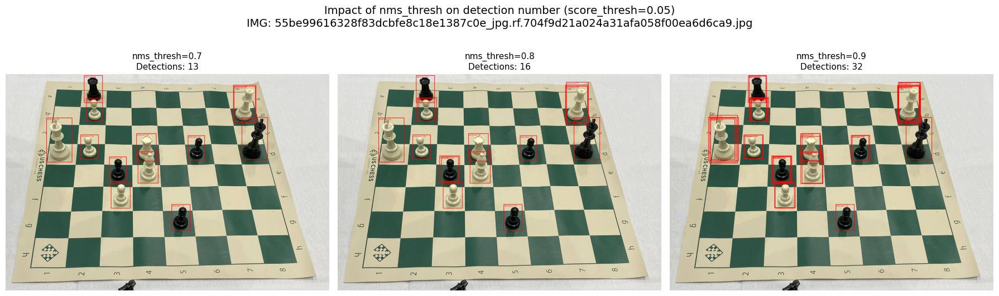

In [22]:
visualize_threshold_impact(test_image, 'score_thresh', [0.01, 0.05, 0.25], 'nms_thresh', 0.5)
visualize_threshold_impact(test_image, 'nms_thresh', [0.7, 0.8, 0.9], 'score_thresh', 0.05)

In [23]:
wild_images = [
    os.path.join('wild', 'chesscom_fide.jpeg'),
    os.path.join('wild', 'chesscom_uscf.jpeg'),
    os.path.join('wild', 'shop.jpg')
]

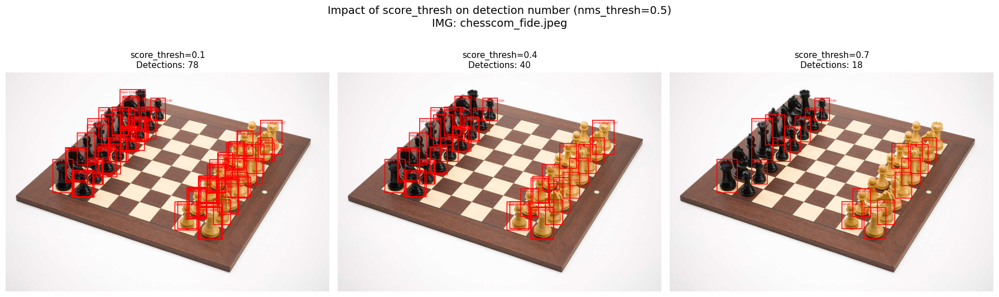

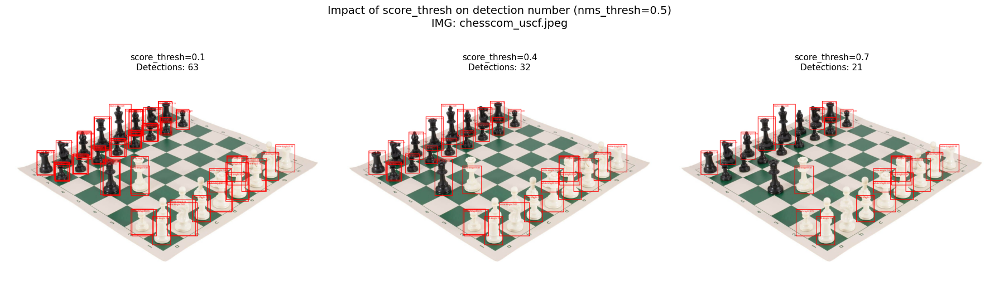

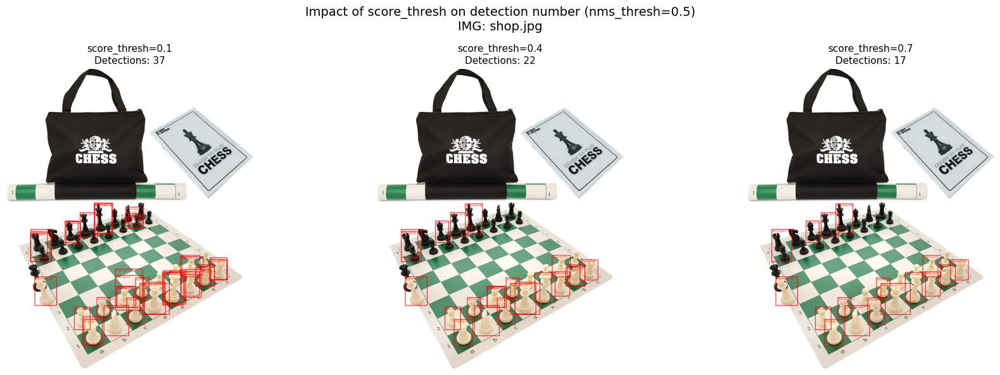

In [24]:
for wild_img in wild_images:
    visualize_threshold_impact(wild_img, 'score_thresh', [0.1, 0.4, 0.7], 'nms_thresh', 0.5)

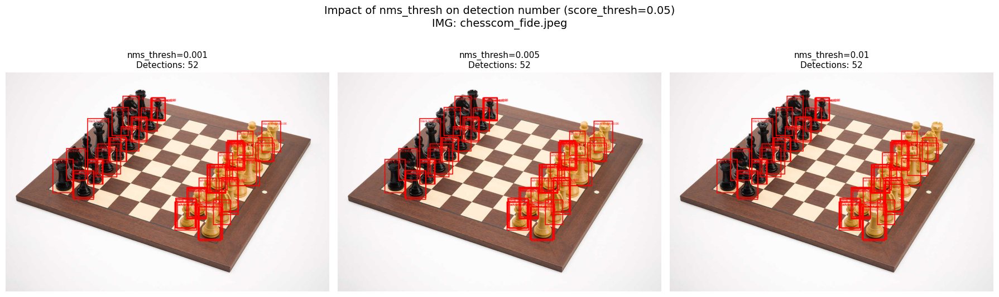

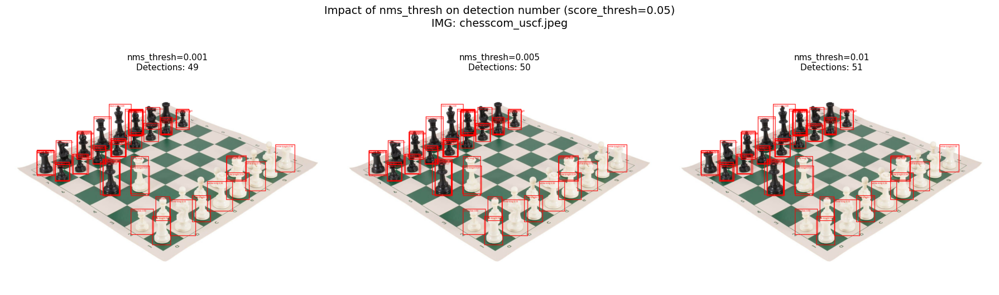

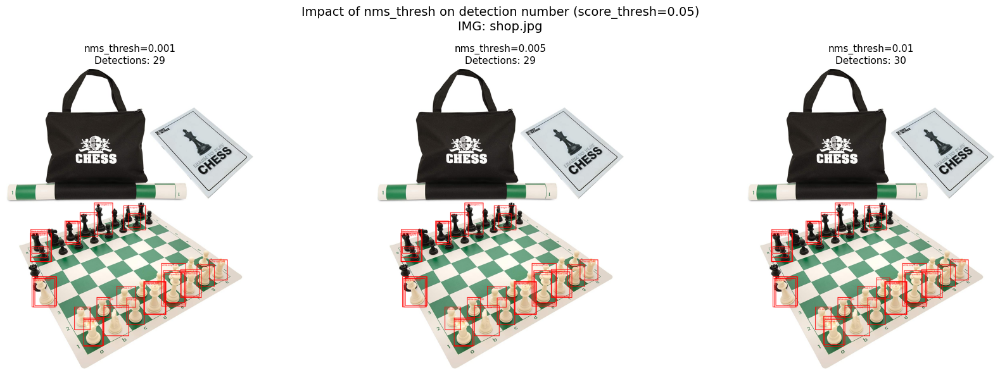

In [25]:
for wild_img in wild_images:
    visualize_threshold_impact(wild_img, 'nms_thresh', [0.001, 0.005, 0.01], 'score_thresh', 0.05)

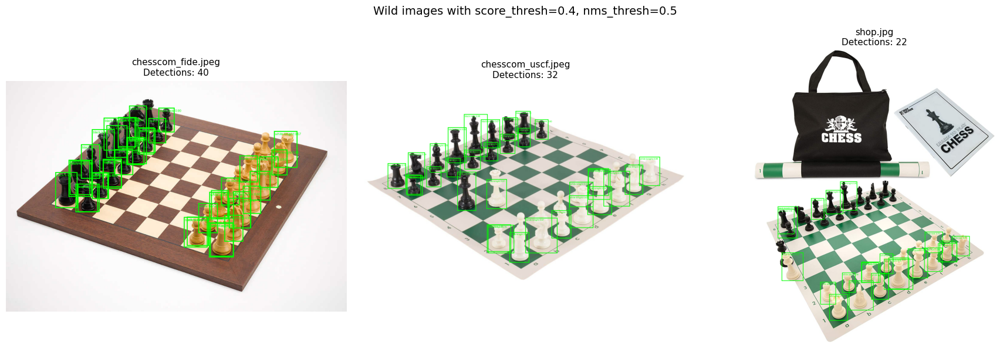

In [ ]:
def visualize_wild_with_thresholds(score_thresh, nms_thresh):
    fig, axes = plt.subplots(1, len(wild_images), figsize=(6 * len(wild_images), 6))
    
    model.eval()
    model.roi_heads.score_thresh = score_thresh
    model.roi_heads.nms_thresh = nms_thresh
    
    for idx, img_path in enumerate(wild_images):
        img = read_image(img_path)
        batch = [preprocess(img).to(DEVICE)]
        
        with torch.no_grad():
            prediction = model(batch)[0]
        
        labels_with_scores = [
            f"{chess_train.coco.cats[label.item()]['name']}: {score:.2f}"
            for label, score in zip(prediction['labels'], prediction['scores'])
        ]
        
        if len(prediction['boxes']) > 0:
            box_img = draw_bounding_boxes(img, boxes=prediction['boxes'], 
                                        labels=labels_with_scores, colors='lime', width=3)
        else:
            box_img = img
        
        axes[idx].imshow(to_pil_image(box_img.detach()))
        axes[idx].set_title(f"{os.path.basename(img_path)}\nDetections: {len(prediction['boxes'])}", fontsize=11)
        axes[idx].axis('off')
    
    model.roi_heads.score_thresh = 0.05
    model.roi_heads.nms_thresh = 0.5
    
    plt.suptitle(f"Wild images with score_thresh={score_thresh}, nms_thresh={nms_thresh}", fontsize=14)
    plt.tight_layout()
    plt.show()


In [ ]:
visualize_wild_with_thresholds(score_thresh=0.4, nms_thresh=0.5)

---

### Zadanie 2a

Zwizualizuj propozycje rejonów wygenerowane przez RPN i porównaj z ostateczną predykcją.

W tym celu konieczne będzie manualne wykonanie fragmentu metody `GeneralizedRCNN::forward` (patrz: [kod](https://github.com/pytorch/vision/blob/617079d944b0e72632311c30ae2bbdf1168b901e/torchvision/models/detection/generalized_rcnn.py#L53), link do wersji najnowszej na grudzień 2025).
Wszystkie fragmenty związane z uczeniem możesz rzecz jasna pominąć; chodzi o wyciągnięcie i przetworzenie obiektu `proposals`.
Nie zapomnij o wykonaniu powrotnej transformacji! (Po co?)

In [30]:
def get_rpn_proposals_and_detections(model, image_path, max_proposals=100):
    model.eval()
    img = read_image(image_path)
    
    original_image_sizes = [(img.shape[1], img.shape[2])]
    
    img_input = [preprocess(img).to(DEVICE)]
    
    with torch.no_grad():
        images, _ = model.transform(img_input, None)
        
        features = model.backbone(images.tensors)
        if isinstance(features, torch.Tensor):
            from collections import OrderedDict
            features = OrderedDict([("0", features)])
        
        proposals, _ = model.rpn(images, features, None)
        
        detections, _ = model.roi_heads(features, proposals, images.image_sizes, None)
        
        proposals_for_postprocess = [{"boxes": p[:max_proposals]} for p in proposals]
        proposals_rescaled = model.transform.postprocess(
            proposals_for_postprocess, images.image_sizes, original_image_sizes
        )
        
        detections_rescaled = model.transform.postprocess(
            detections, images.image_sizes, original_image_sizes
        )
    
    return img, proposals_rescaled[0]["boxes"], detections_rescaled[0]

In [28]:
def visualize_proposals_vs_detections(image_path, max_proposals=100):
    img, proposals, detections = get_rpn_proposals_and_detections(model, image_path, max_proposals)
    
    _, axes = plt.subplots(1, 2, figsize=(16, 8))
    
    proposals_img = draw_bounding_boxes(
        img, boxes=proposals[:max_proposals], 
        colors='blue', width=2
    )

    
    axes[0].imshow(to_pil_image(proposals_img.detach()))
    axes[0].set_title(f"RPN Proposals (top {min(max_proposals, len(proposals))} of {len(proposals)})", fontsize=12)
    axes[0].axis('off')
    
    labels_with_scores = [
        f"{chess_train.coco.cats[label.item()]['name']}: {score:.2f}"
        for label, score in zip(detections['labels'], detections['scores'])
    ]
    detections_img = draw_bounding_boxes(
        img, boxes=detections['boxes'],
        labels=labels_with_scores, colors='red', width=3
    )
    
    axes[1].imshow(to_pil_image(detections_img.detach()))
    axes[1].set_title(f"Final Detections ({len(detections['boxes'])} objects)", fontsize=12)
    axes[1].axis('off')
    
    plt.suptitle(f"RPN Proposals vs Final Detections\n{os.path.basename(image_path)}", fontsize=14)
    plt.tight_layout()
    plt.show()

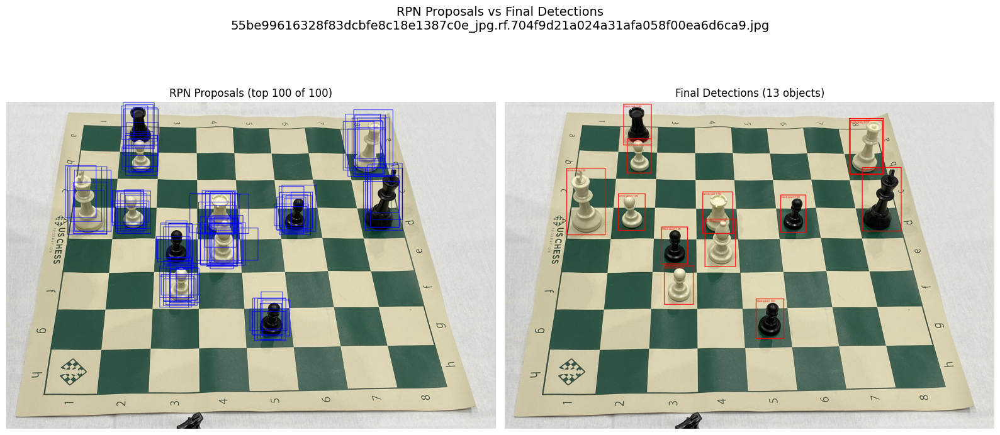

In [31]:
visualize_proposals_vs_detections(test_image)

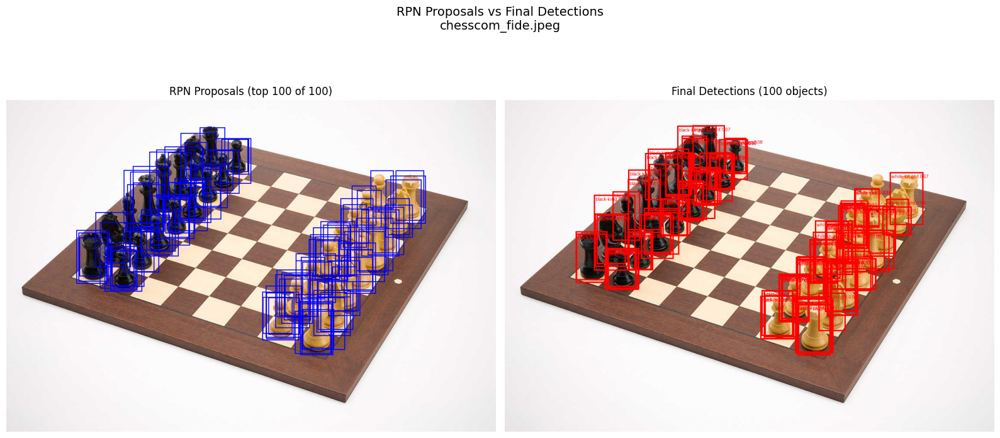

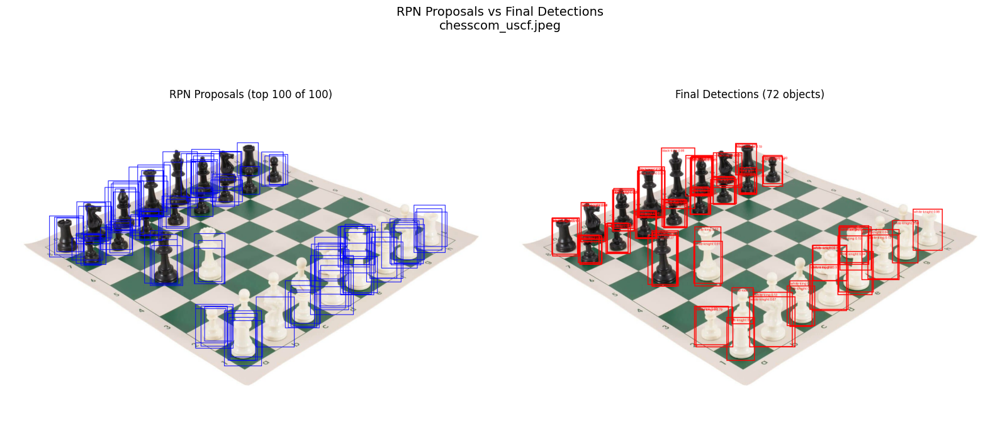

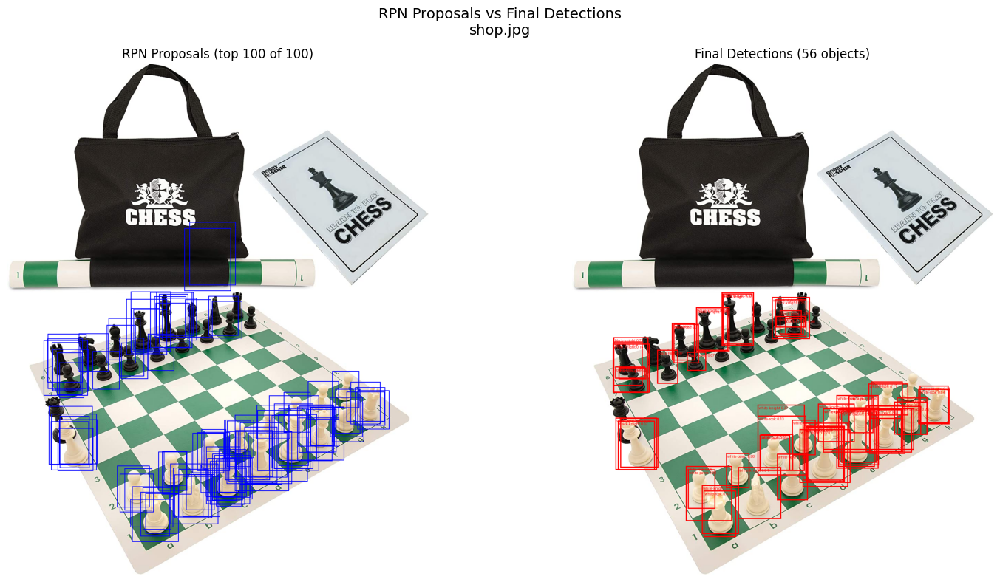

In [32]:

for wild_img in wild_images:
    visualize_proposals_vs_detections(wild_img)

### Zadanie 2b

Zbadaj wpływ progu NMS _na etapie propozycji_ na jakość predykcji oraz czas ich uzyskania.
Jak w poprzednich zadaniach, postaraj się nie ograniczyć tylko do pokazania metryk, ale pokaż wizualizacje (propozycji i predykcji) dla **wybranych** przykładów.

In [58]:
print(f"Default RPN NMS threshold: {model.rpn.nms_thresh}")
print(f"Default RPN NMS score: {model.rpn.score_thresh}")
print(f"Default RPN pre_nms_top_n (test): {model.rpn._pre_nms_top_n['testing']}")
print(f"Default RPN post_nms_top_n (test): {model.rpn._post_nms_top_n['testing']}")

Default RPN NMS threshold: 0.7
Default RPN NMS score: 0.0
Default RPN pre_nms_top_n (test): 1000
Default RPN post_nms_top_n (test): 1000


In [59]:
def evaluate_with_rpn_nms(model, data_loader, rpn_nms_thresh, device):
    original_nms_thresh = model.rpn.nms_thresh
    model.rpn.nms_thresh = rpn_nms_thresh
    
    start_time = time.time()
    coco_evaluator = evaluate(model, data_loader, device=device)
    elapsed_time = time.time() - start_time
    
    model.rpn.nms_thresh = original_nms_thresh
    
    return coco_evaluator, elapsed_time

In [60]:
rpn_nms_thresholds = [0.05, 0.2, 0.5, 0.7, 0.9]

rpn_results = []

for rpn_nms in rpn_nms_thresholds:
    print(f"\nRPN NMS threshold: {rpn_nms}")
    coco_eval, elapsed = evaluate_with_rpn_nms(model, val_loader, rpn_nms, DEVICE)
    stats = coco_eval.coco_eval['bbox'].stats
    
    rpn_results.append({
        'rpn_nms_thresh': rpn_nms,
        'mAP': stats[0],
        'mAP_50': stats[1],
        'mAP_75': stats[2],
        'time_sec': elapsed
    })


RPN NMS threshold: 0.05
Test:  [ 0/58]  eta: 0:00:11  model_time: 0.0960 (0.0960)  evaluator_time: 0.0010 (0.0010)  time: 0.1960  data: 0.0890  max mem: 8499
Test:  [57/58]  eta: 0:00:00  model_time: 0.0270 (0.0301)  evaluator_time: 0.0010 (0.0011)  time: 0.0767  data: 0.0459  max mem: 8499
Test: Total time: 0:00:04 (0.0839 s / it)
Averaged stats: model_time: 0.0270 (0.0301)  evaluator_time: 0.0010 (0.0011)
Accumulating evaluation results...
DONE (t=0.02s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.749
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.973
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.920
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.749
 Average Recall     (AR) @[ IoU=0.50:0

 rpn_nms_thresh      mAP   mAP_50   mAP_75  time_sec
           0.05 0.749266 0.973260 0.919554  4.895677
           0.20 0.754376 0.980040 0.928057  4.747305
           0.50 0.757313 0.984991 0.932173  4.764210
           0.70 0.764515 0.985340 0.941816  4.926908
           0.90 0.753225 0.985224 0.946404  4.947239


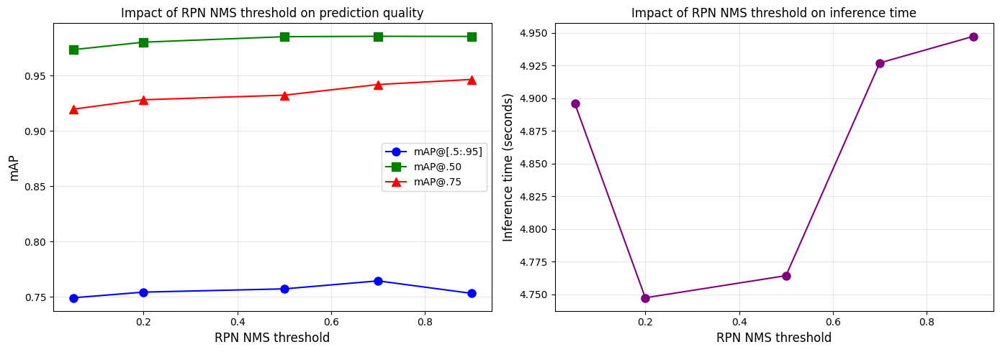

In [61]:
df_rpn = pd.DataFrame(rpn_results)
print(df_rpn.to_string(index=False))

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(df_rpn['rpn_nms_thresh'], df_rpn['mAP'], 'b-o', label='mAP@[.5:.95]', markersize=8)
axes[0].plot(df_rpn['rpn_nms_thresh'], df_rpn['mAP_50'], 'g-s', label='mAP@.50', markersize=8)
axes[0].plot(df_rpn['rpn_nms_thresh'], df_rpn['mAP_75'], 'r-^', label='mAP@.75', markersize=8)
axes[0].set_xlabel('RPN NMS threshold', fontsize=12)
axes[0].set_ylabel('mAP', fontsize=12)
axes[0].set_title('Impact of RPN NMS threshold on prediction quality', fontsize=12)
axes[0].legend()
axes[0].grid(True, alpha=0.3)

axes[1].plot(df_rpn['rpn_nms_thresh'], df_rpn['time_sec'], 'purple', marker='o', markersize=8)
axes[1].set_xlabel('RPN NMS threshold', fontsize=12)
axes[1].set_ylabel('Inference time (seconds)', fontsize=12)
axes[1].set_title('Impact of RPN NMS threshold on inference time', fontsize=12)
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [62]:
def get_proposals_with_rpn_nms(model, image_path, rpn_nms_thresh, max_proposals=100):
    original_nms_thresh = model.rpn.nms_thresh
    model.rpn.nms_thresh = rpn_nms_thresh
    
    img, proposals, detections = get_rpn_proposals_and_detections(model, image_path, max_proposals)
    
    model.rpn.nms_thresh = original_nms_thresh
    
    return img, proposals, detections

In [63]:
def visualize_rpn_nms_impact(image_path, rpn_nms_values, max_proposals=100):
    n_cols = len(rpn_nms_values)
    _, axes = plt.subplots(2, n_cols, figsize=(6 * n_cols, 12))
    
    for col, rpn_nms in enumerate(rpn_nms_values):
        img, proposals, detections = get_proposals_with_rpn_nms(model, image_path, rpn_nms, max_proposals)
        
        if len(proposals) > 0:
            proposals_img = draw_bounding_boxes(
                img, boxes=proposals[:max_proposals], 
                colors='blue', width=2
            )
        else:
            proposals_img = img
        
        axes[0, col].imshow(to_pil_image(proposals_img.detach()))
        axes[0, col].set_title(f"RPN NMS={rpn_nms}\nProposals: {len(proposals)}", fontsize=11)
        axes[0, col].axis('off')
        
        if len(detections['boxes']) > 0:
            labels_with_scores = [
                f"{chess_train.coco.cats[label.item()]['name']}: {score:.2f}"
                for label, score in zip(detections['labels'], detections['scores'])
            ]
            detections_img = draw_bounding_boxes(
                img, boxes=detections['boxes'],
                labels=labels_with_scores, colors='red', width=3
            )
        else:
            detections_img = img
        
        axes[1, col].imshow(to_pil_image(detections_img.detach()))
        axes[1, col].set_title(f"Detections: {len(detections['boxes'])}", fontsize=11)
        axes[1, col].axis('off')
    
    axes[0, 0].set_ylabel("RPN Proposals", fontsize=12)
    axes[1, 0].set_ylabel("Final Detections", fontsize=12)
    
    plt.suptitle(f"Impact of RPN NMS threshold\n{os.path.basename(image_path)}", fontsize=14)
    plt.tight_layout()
    plt.show()

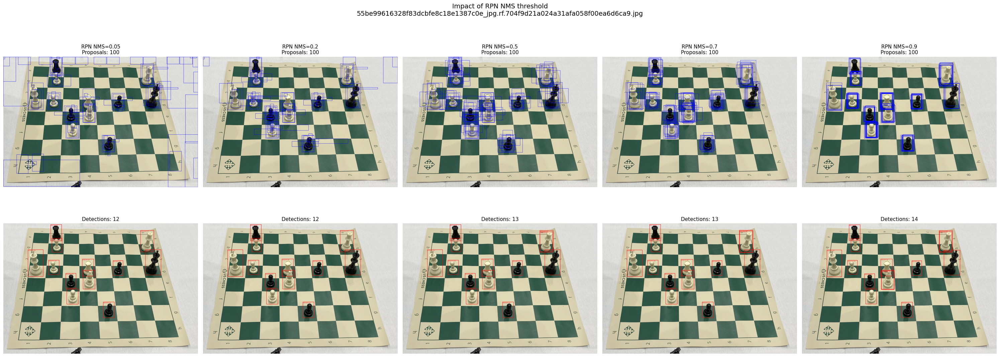

In [64]:
visualize_rpn_nms_impact(test_image, rpn_nms_thresholds)

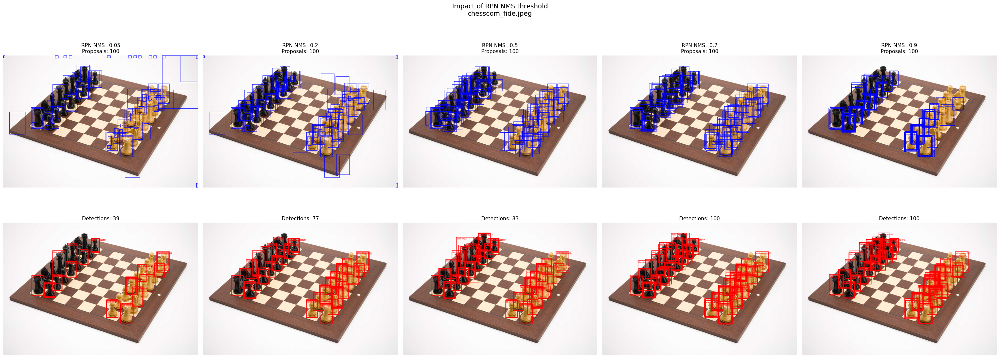

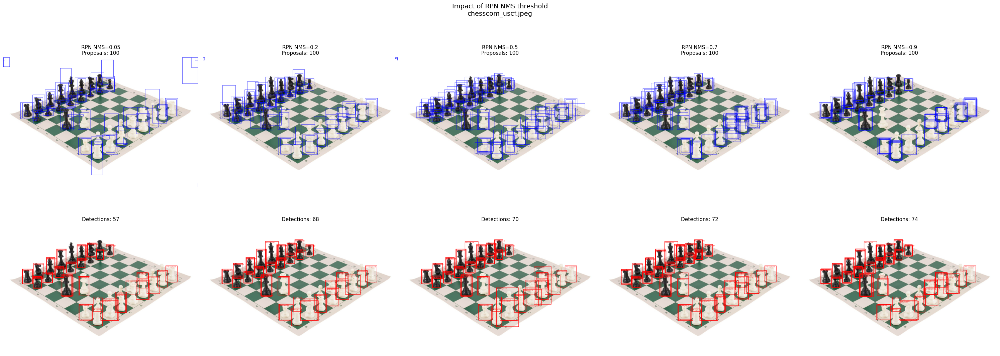

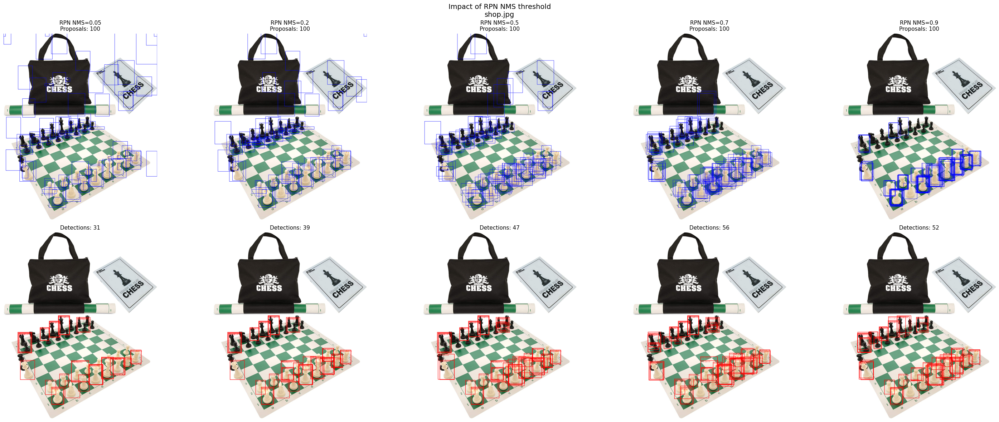

In [65]:
for wild_img in wild_images:
    visualize_rpn_nms_impact(wild_img, rpn_nms_thresholds)